In [1]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np
import nglview as nv
from scipy.stats import gaussian_kde
import deeptime
from deeptime.decomposition import TICA
from deeptime.clustering import KMeans
from deeptime.markov import TransitionCountEstimator
from deeptime.covariance import KoopmanWeightingEstimator

In [2]:
# ?md.compute_phi

In [38]:
def compute_phi_psi(traj):
    phi_indices, phi_vals = md.compute_phi(traj)
    psi_indices, psi_vals = md.compute_psi(traj)
    return phi_indices, phi_vals, psi_indices, psi_vals

phi_atoms = [
    [4, 6, 8, 17],
    [17, 19, 21, 30],
    [30, 32, 34, 43],
    [43, 45, 47, 56],
    [56, 58, 60, 69],
    [69, 71, 73, 82],
    [82, 84, 86, 95],
    [95, 97, 99, 108],
    [108, 110, 112, 121]
]

psi_atoms = [
    [6, 8, 17, 19],
    [19, 21, 30, 32],
    [32, 34, 43, 45],
    [45, 47, 56, 58],
    [58, 60, 69, 71],
    [71, 73, 82, 84],
    [84, 86, 95, 97],
    [97, 99, 108, 110],
    [110, 112, 121, 123]
]

def compute_custom_phi_psi(traj, phi_atoms, psi_atoms):
    phi_vals = np.array([md.compute_dihedrals(traj, [atoms])[:, 0] for atoms in phi_atoms]).T
    psi_vals = np.array([md.compute_dihedrals(traj, [atoms])[:, 0] for atoms in psi_atoms]).T
    return phi_vals, psi_vals

def ramachandran_grid(traj, phi_atoms, psi_atoms, title=None, colorbar=None, colorbar_label=None):
    phi_vals, psi_vals = compute_custom_phi_psi(traj, phi_atoms, psi_atoms)

    phi_vals = np.degrees(phi_vals)
    psi_vals = np.degrees(psi_vals)

    fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))

    for idx in range(9):
        row, col = divmod(idx, 3)
        ax = axs[row, col]

        phi = phi_vals[:, idx]
        psi = psi_vals[:, idx]

        mask = ~np.isnan(phi) & ~np.isnan(psi)
        phi = phi[mask]
        psi = psi[mask]

        if len(phi) == 0 or len(psi) == 0:
            ax.axis('off')
            continue

        xy = np.vstack([phi, psi])
        if colorbar is not None and colorbar != 'KDE':
            sc = ax.scatter(phi, psi, s=5, c=colorbar, edgecolor='none', cmap='viridis')
            # add colorbar
            cbar = plt.colorbar(sc, ax=ax)
            cbar.set_label(colorbar, fontsize=12)
            if colorbar_label:
                cbar.set_label(colorbar_label, fontsize=12)
        elif colorbar=='KDE':
            z = gaussian_kde(xy)(xy)
            sc = ax.scatter(phi, psi, s=5, c=z, edgecolor='none', cmap='viridis')
        else:
            sc = ax.scatter(phi, psi, s=5, edgecolor='none', cmap='viridis')

        
        # ax.set_xlim(-180, 180)
        # ax.set_ylim(-180, 180)
        # ax.set_xticks([-180, 0, 180])
        # ax.set_yticks([-180, 0, 180])

        ax.set_xlim(-150, 150)
        ax.set_ylim(-150, 150)
        ax.set_xticks([-150, 0, 150])
        ax.set_yticks([-150, 0, 150])
        
        ax.set_xlabel(fr'$\Phi_{idx+1}$', fontsize = 15)
        ax.set_ylabel(fr'$\Psi_{idx+1}$', fontsize = 15)
        ax.set_title(f'Residue {idx + 1}', fontsize=12)

    # plt.suptitle(title or "Ramachandran Plot Grid (Custom ψ vs φ for AIB9)", fontsize=18)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()
    # plt.suptitle(title or "Ramachandran Plot Grid (ψ vs φ) for AIB9", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

def post_analysis(job_path, traj_file, top_file, native_file):
    traj = md.load(f'{job_path}/{traj_file}', top=f'{job_path}/{top_file}')
    native = md.load(f'{job_path}/{native_file}')
    rmsd = md.rmsd(traj, native, atom_indices=traj.top.select('name CA'))
    return traj, rmsd

In [5]:
data_gad = post_analysis('/home/siddarthachar/gad-linux/achar_examples/AIB9_setup/',
                         'traj.dcd',
                         'equilibrated_npt.pdb',
                         'equilibrated_npt.pdb')
# data_unbiased = post_analysis('chignolin-explicit-solvents/unbiased-amber14sb/',
#                          'traj_chignolin.dcd',
#                          'equilibrated_chignolin.pdb',
#                          'equilibrated_chignolin.pdb')

In [4]:
eigvals=np.loadtxt('/home/siddarthachar/gad-linux/achar_examples/AIB9_setup/eigvals.log')
eigval_min = np.min(eigvals, axis=1)
eigval_norm = (eigval_min - eigval_min.min()) / (eigval_min.max() - eigval_min.min())
# plt.plot(eigval_norm)


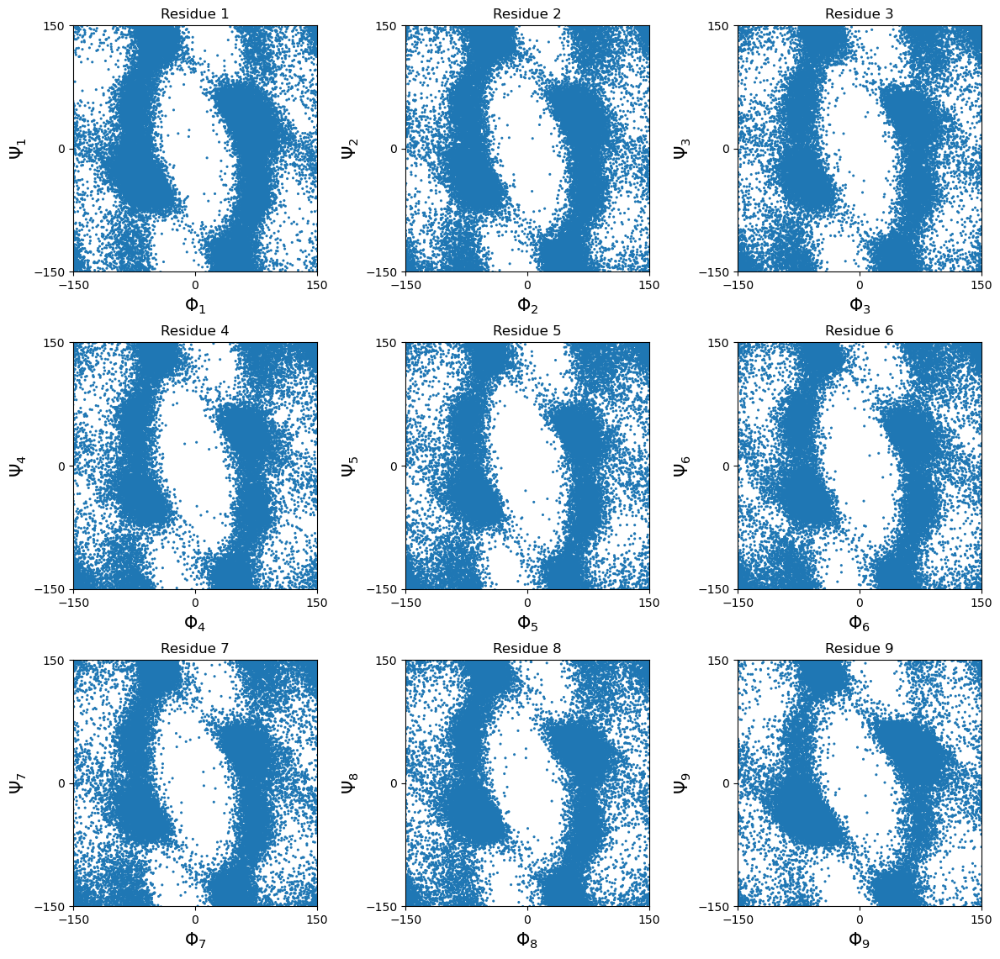

<Figure size 640x480 with 0 Axes>

In [8]:
ramachandran_grid(data_gad[0], phi_atoms, psi_atoms)
# compute_phi_psi(data_gad[0])
# data_gad

In [ ]:
traj = data_gad[0]
traj.superpose(traj[0], atom_indices=[atom.index for atom in traj.topology.atoms if atom.element.symbol != 'H'])
# now visualize
view = nv.show_mdtraj(traj)
# view.add_licorice(selection='not water')
# view.add_unitcell()
view

NGLWidget(max_frame=9999)

In [2]:
def ramachandran_grid_colored_by_eig(traj, phi_atoms, psi_atoms, eigvals, title=None, stride=2):
    """
    Make a 3x3 Ramachandran grid where each point's color is based on the normalized
    min eigenvalue for that frame. Ensures consistent length across arrays.
    """
    traj_stride = traj[::stride]

    # Compute torsions on subsampled trajectory
    phi_vals, psi_vals = compute_custom_phi_psi(traj_stride, phi_atoms, psi_atoms)
    phi_vals = np.degrees(phi_vals)
    psi_vals = np.degrees(psi_vals)

    # Normalize minimum eigenvalue per frame
    eigval_min = np.min(eigvals, axis=1)
    eigval_norm = (eigval_min - eigval_min.min()) / (eigval_min.max() - eigval_min.min())

    if len(eigval_norm) != phi_vals.shape[0]:
        # raise ValueError(f"Mismatch: {len(eigval_norm)} eigenval frames vs {phi_vals.shape[0]} traj frames. Adjust stride.")
        min_len = min(len(eigval_norm), phi_vals.shape[0])
        eigval_norm = eigval_norm[:min_len]
        phi_vals = phi_vals[:min_len, :]
        psi_vals = psi_vals[:min_len, :]

    fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12), sharex=True, sharey=True)

    for idx in range(9):
        row, col = divmod(idx, 3)
        ax = axs[row, col]

        phi = phi_vals[:, idx]
        psi = psi_vals[:, idx]

        mask = ~np.isnan(phi) & ~np.isnan(psi)
        phi = phi[mask]
        psi = psi[mask]
        eig_col = eigval_norm[mask]

        if len(phi) == 0 or len(psi) == 0:
            ax.axis('off')
            continue

        sc = ax.scatter(phi, psi, c=eig_col, s=5, cmap='viridis', edgecolor='none')
        ax.set_xlim(-180, 180)
        ax.set_ylim(-180, 180)
        ax.set_xlabel(fr'$\Phi_{idx}$', fontsize = 15)
        ax.set_ylabel(fr'$\Psi_{idx}$', fontsize = 15)
        ax.set_xticks([-180, 0, 180])
        ax.set_yticks([-180, 0, 180])
        ax.set_title(f'Residue {idx + 1}', fontsize=12)

    # Shared colorbar
    fig.subplots_adjust(right=0.88)
    cbar_ax = fig.add_axes([1.1, 0.15, 0.02, 0.7])
    norm = plt.Normalize(vmin=0.0, vmax=1.0)
    fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='viridis'), cax=cbar_ax, label='Normalized min eigenvalue')

    # plt.suptitle(title or "Ramachandran Grid Colored by Normalized min(eigval)", fontsize=18)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()


In [ ]:
ramachandran_grid_colored_by_eig(data_gad[0], phi_atoms, psi_atoms, eigvals,stride=2)


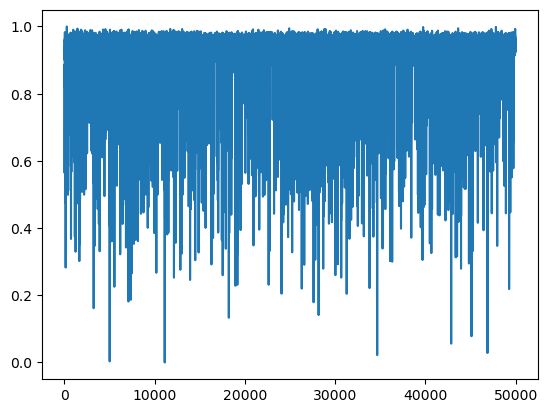

In [ ]:
eigval_min = np.min(eigvals, axis=1)
eigval_norm = (eigval_min - eigval_min.min()) / (eigval_min.max() - eigval_min.min())
# plt.plot(eigval_norm)

## Learning CVs using TICA

In [91]:
import torch
# from mlcolvar.utils.io import write_pytorch_model
from mlcolvar.cvs import DeepTICA
from sklearn.preprocessing import StandardScaler
from mlcolvar.utils.io import load_dataframe
from mlcolvar.utils.timelagged import create_timelagged_dataset
from mlcolvar.data import DictModule
import tqdm

In [ ]:
# ?create_timelagged_dataset
# np.linspace(0,1e8,100000)
_, phi_X, _, psi_X = compute_phi_psi(data_gad[0])

In [ ]:
# phi_X.shape



(100000, 16)

In [90]:
# === Load your trajectory and extract CA-CA distances ===
traj = data_gad[0]  # assuming this is a single trajectory

# using heavy atoms (CA) for distance calculation
# heavy_atoms = [atom.index for atom in traj.topology.atoms if atom.name == 'CA' and atom.residue.name != 'HOH']
# pairs = [(heavy_atoms[i], heavy_atoms[j]) for i in range(len(heavy_atoms)) for j in range(i+1, len(heavy_atoms))]
# X = md.compute_distances(traj, pairs)
# print(f"Feature matrix shape: {X.shape}")

# using dihedral angles as features
X = np.hstack([np.sin(phi_X), np.cos(phi_X), np.sin(psi_X), np.cos(psi_X)])

dataset = create_timelagged_dataset(X,lag_time=100)
datamodule = DictModule(dataset,lengths=[0.8,0.2])#,random_split=False,shuffle=False)

/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/mlcolvar/utils/timelagged.py:140: UserWarning: Monitoring the progress for the search of time-lagged configurations with a progress_bar requires `tqdm`.
  warnings.warn(


In [ ]:
from mlcolvar.cvs import DeepTICA

n_components = 2
nn_layers = [X.shape[1], 100, 30, 100, n_components]
options= {'nn': {'activation': 'tanh'}}

model = DeepTICA(nn_layers, options=options)
model

DeepTICA(
  (loss_fn): ReduceEigenvaluesLoss()
  (norm_in): Normalization(in_features=32, out_features=32, mode=mean_std)
  (nn): FeedForward(
    (nn): Sequential(
      (0): Linear(in_features=32, out_features=50, bias=True)
      (1): Tanh()
      (2): Linear(in_features=50, out_features=100, bias=True)
      (3): Tanh()
      (4): Linear(in_features=100, out_features=50, bias=True)
      (5): Tanh()
      (6): Linear(in_features=50, out_features=2, bias=True)
    )
  )
  (tica): TICA(in_features=2, out_features=2)
)

In [84]:
import lightning
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from mlcolvar.utils.trainer import MetricsCallback

# define callbacks
metrics = MetricsCallback()
early_stopping = EarlyStopping(monitor="valid_loss", min_delta=1e-3, patience=10)

# define trainer
trainer = lightning.Trainer(callbacks=[metrics, early_stopping],
                     max_epochs=None, logger=None, enable_checkpointing=False)

# fit
trainer.fit( model, datamodule )

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type                  | Params | Mode  | In sizes | Out sizes
---------------------------------------------------------------------------------
0 | loss_fn | ReduceEigenvaluesLoss | 0      | train | ?        | ?        
1 | norm_in | Normalization         | 0      | train | [1, 32]  | [1, 32]  
2 | nn      | FeedForward           | 12.3 K | train | [1, 32]  | [1, 9]   
3 | tica    | TICA                  | 0      | train | [1, 9]   | [1, 9]   
---------------------------------------------------------------------------------
12.3 K    Trainable params
0         Non-trainable params
12.3 K    Total params
0.049     Total estimated model params size (MB)
12        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

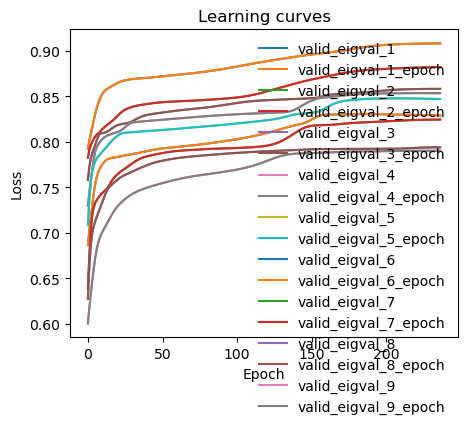

In [85]:
from mlcolvar.utils.plot import plot_metrics

ax = plot_metrics(metrics.metrics,
                  keys=[x for x in  metrics.metrics.keys() if 'valid_eigval' in x],#['train_loss_epoch','valid_loss'],
                  #linestyles=['-.','-'], colors=['fessa1','fessa5'],
                  yscale='linear')

In [86]:
from mlcolvar.core.transform import Normalization
from mlcolvar.core.transform.utils import Statistics

#X = dataset[:]['data']
with torch.no_grad():
    model.postprocessing = None # reset
    s = model(torch.Tensor(X))

norm =  Normalization(n_components, mode='min_max', stats = Statistics(s) )
model.postprocessing = norm

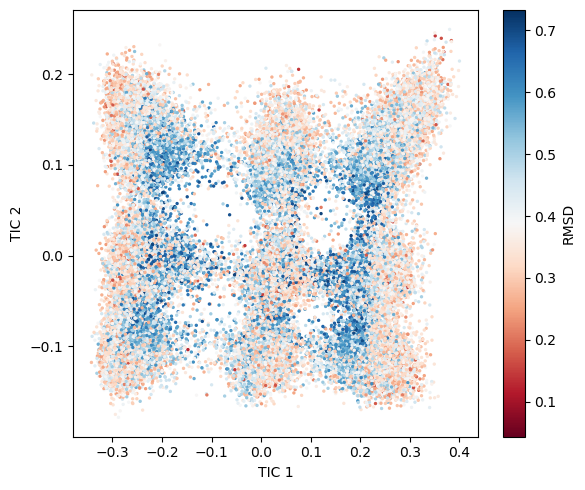

In [ ]:
plt.figure(figsize=(6, 5))
sc = plt.scatter(s.detach().numpy()[:, 0], s.detach().numpy()[:, 1], s=2, c=data_gad[1],cmap="RdBu")
plt.colorbar(sc, label='RMSD')
plt.xlabel('TIC 1')
plt.ylabel('TIC 2')
# plt.grid(True)
plt.tight_layout()
plt.show()

In [88]:
tic_col_dims = []
for i in range(9):
    tic_col = s.detach().numpy()[:, i]
    tic_col_dims.append(tic_col.reshape(-1, 1))
# tic1 = s.detach().numpy()[:, 0]
# tic1_col = tic1.reshape(-1, 1)

# tic2 = s.detach().numpy()[:, 1]
# tic2_col = tic2.reshape(-1, 1)

/tmp/ipykernel_2517/3958552190.py:59: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if colorbar is not None and colorbar != 'KDE':
/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/matplotlib/text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


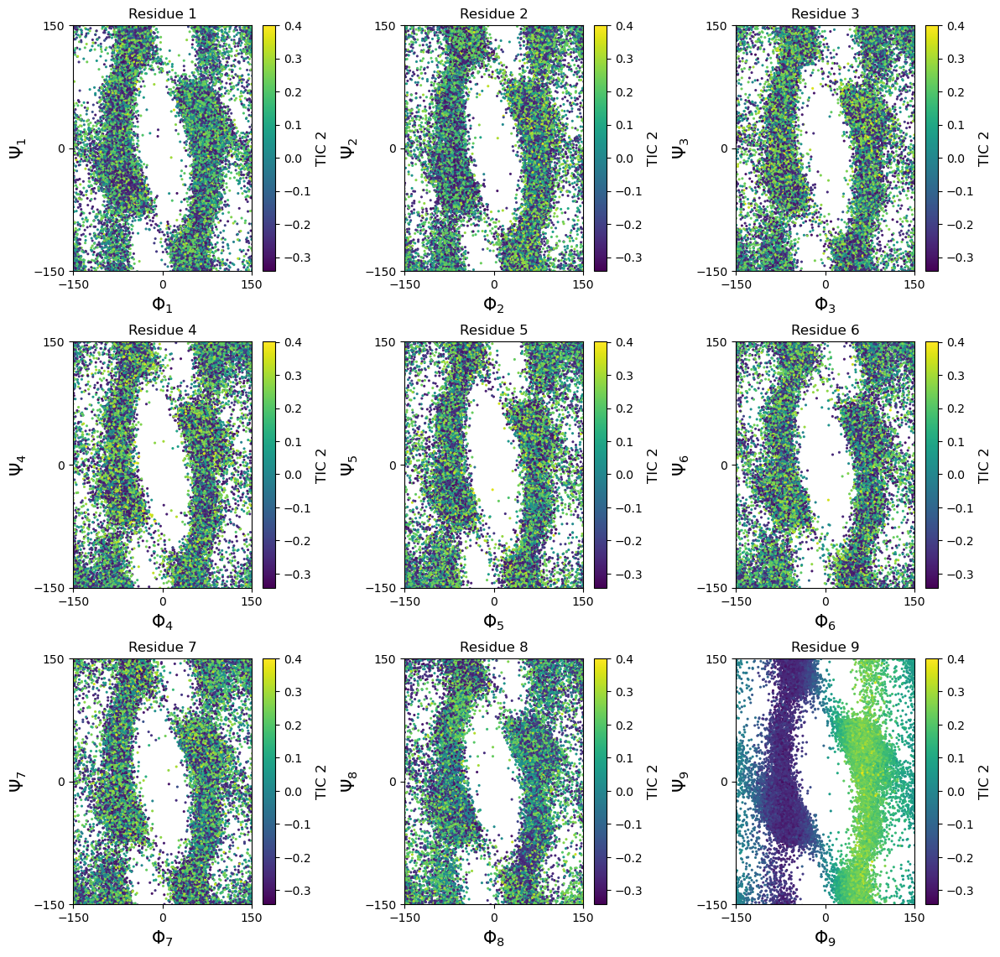

<Figure size 640x480 with 0 Axes>

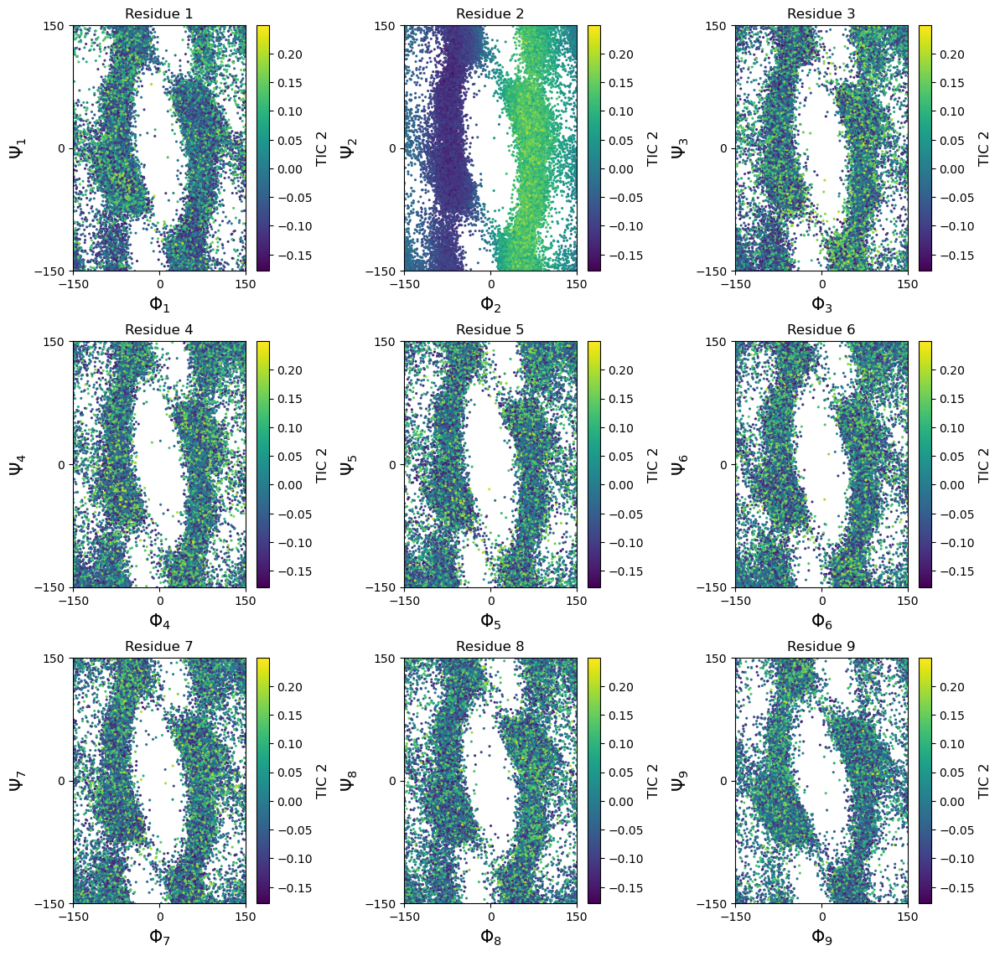

<Figure size 640x480 with 0 Axes>

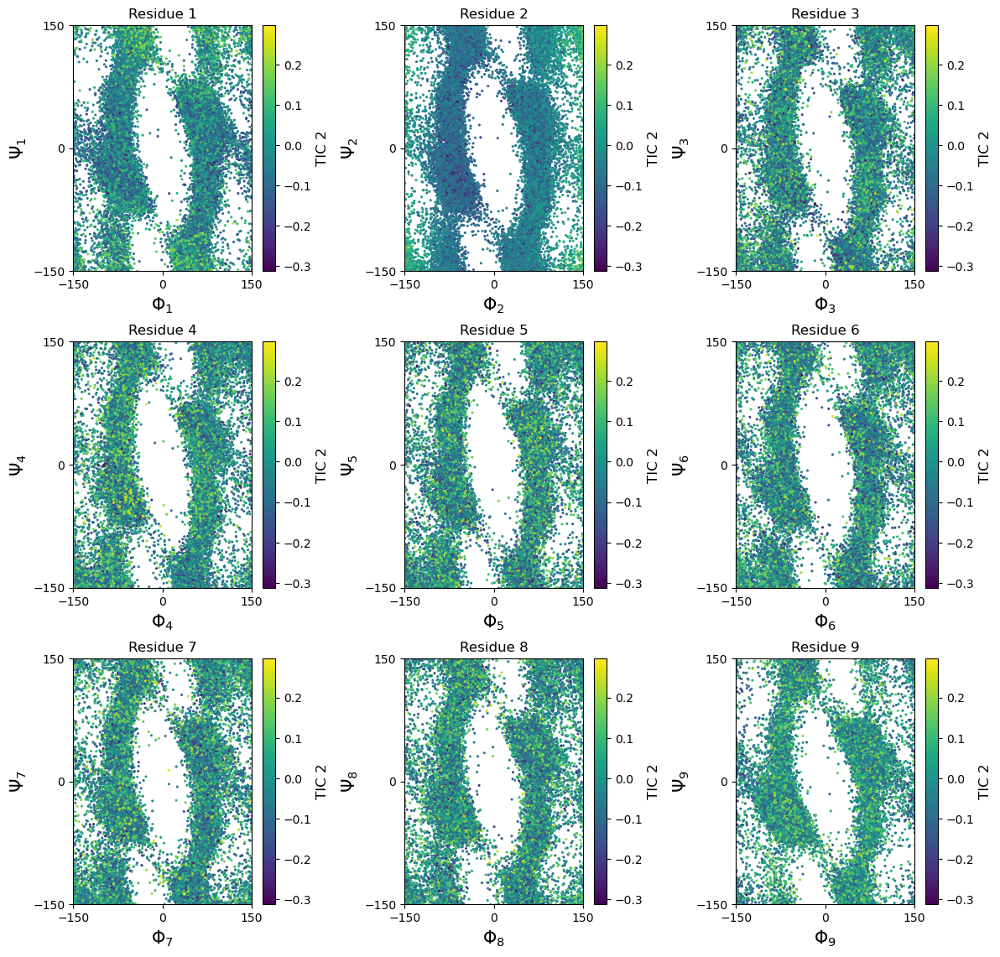

<Figure size 640x480 with 0 Axes>

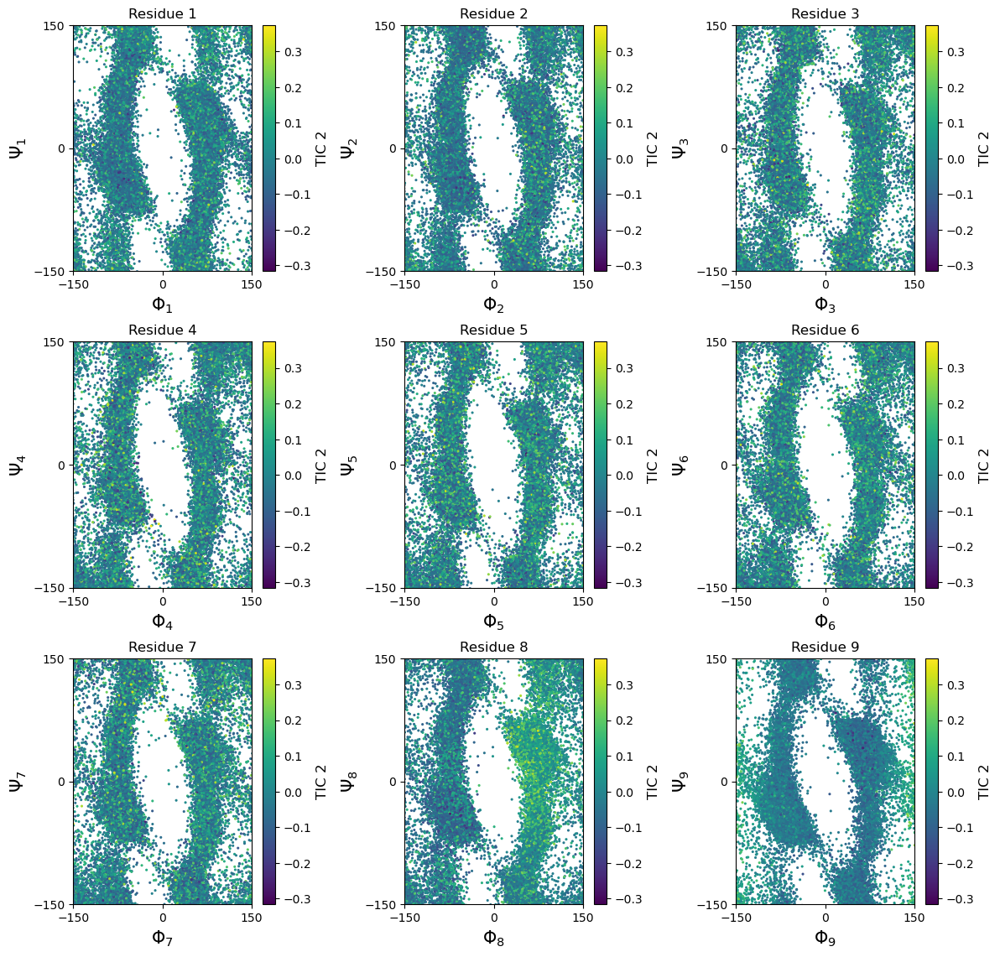

<Figure size 640x480 with 0 Axes>

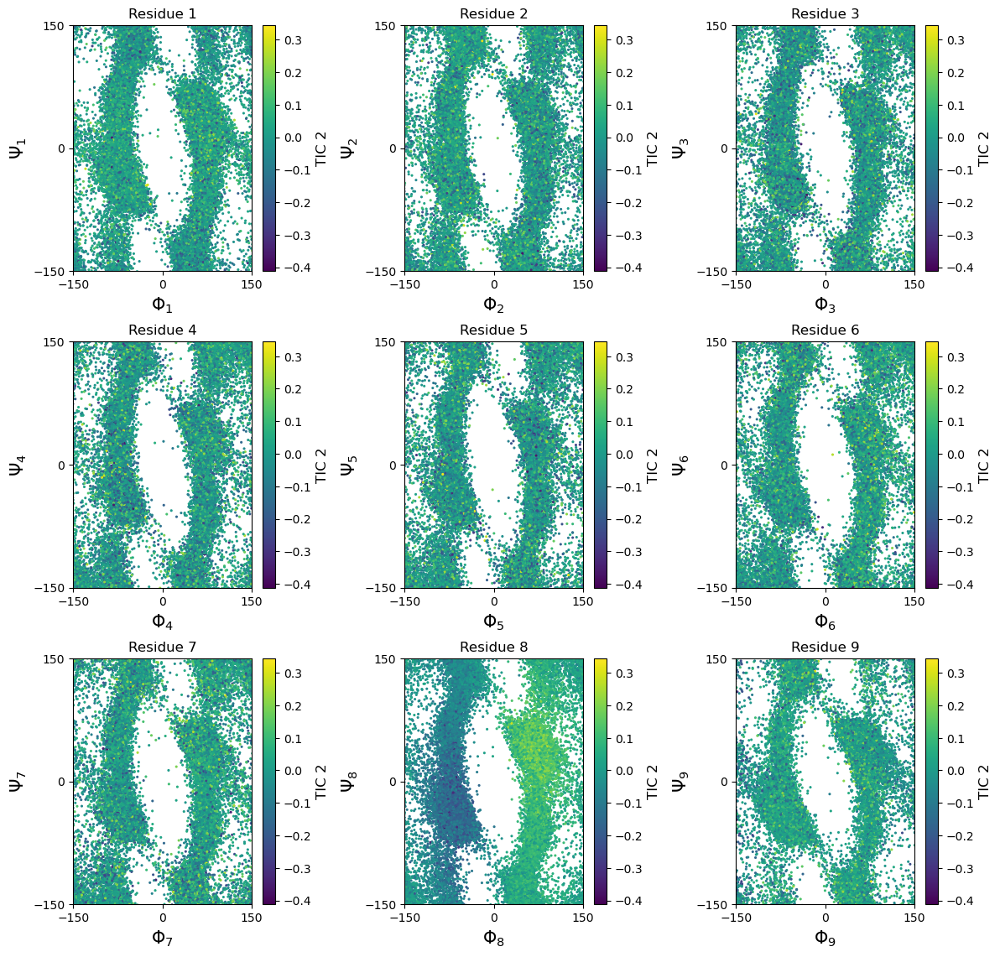

<Figure size 640x480 with 0 Axes>

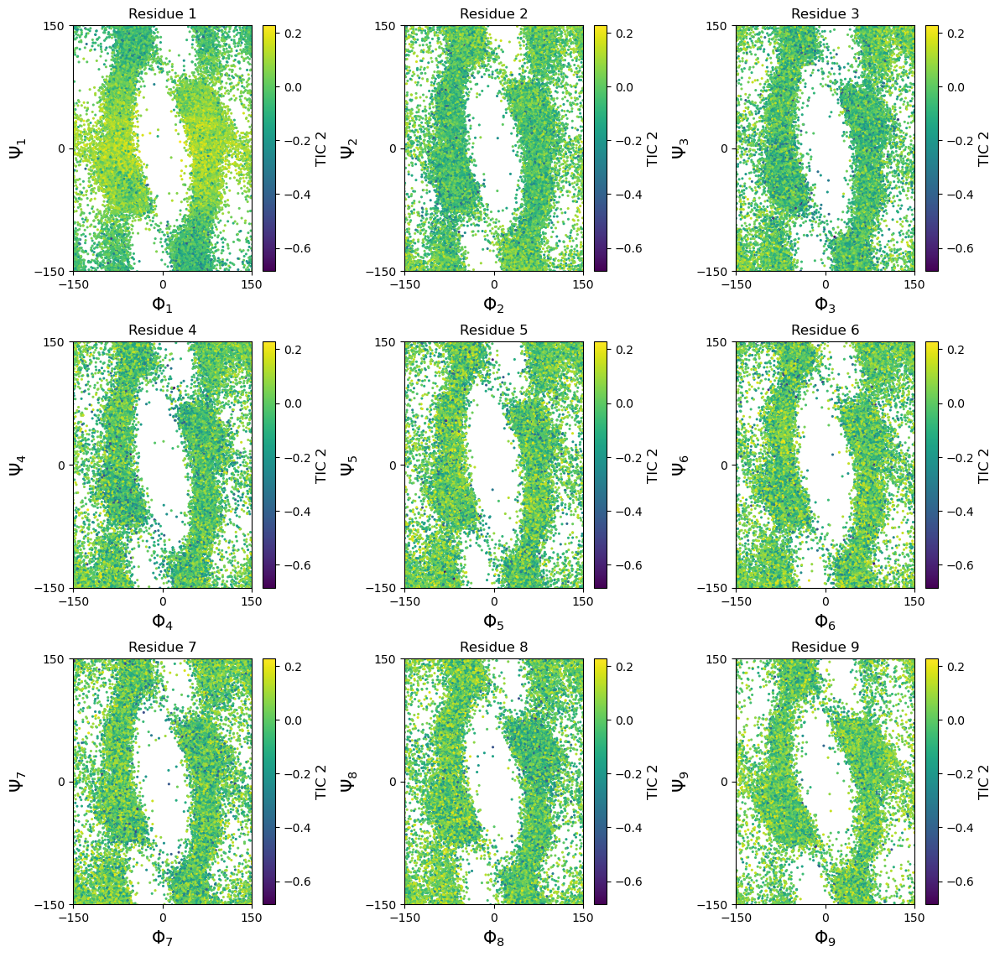

<Figure size 640x480 with 0 Axes>

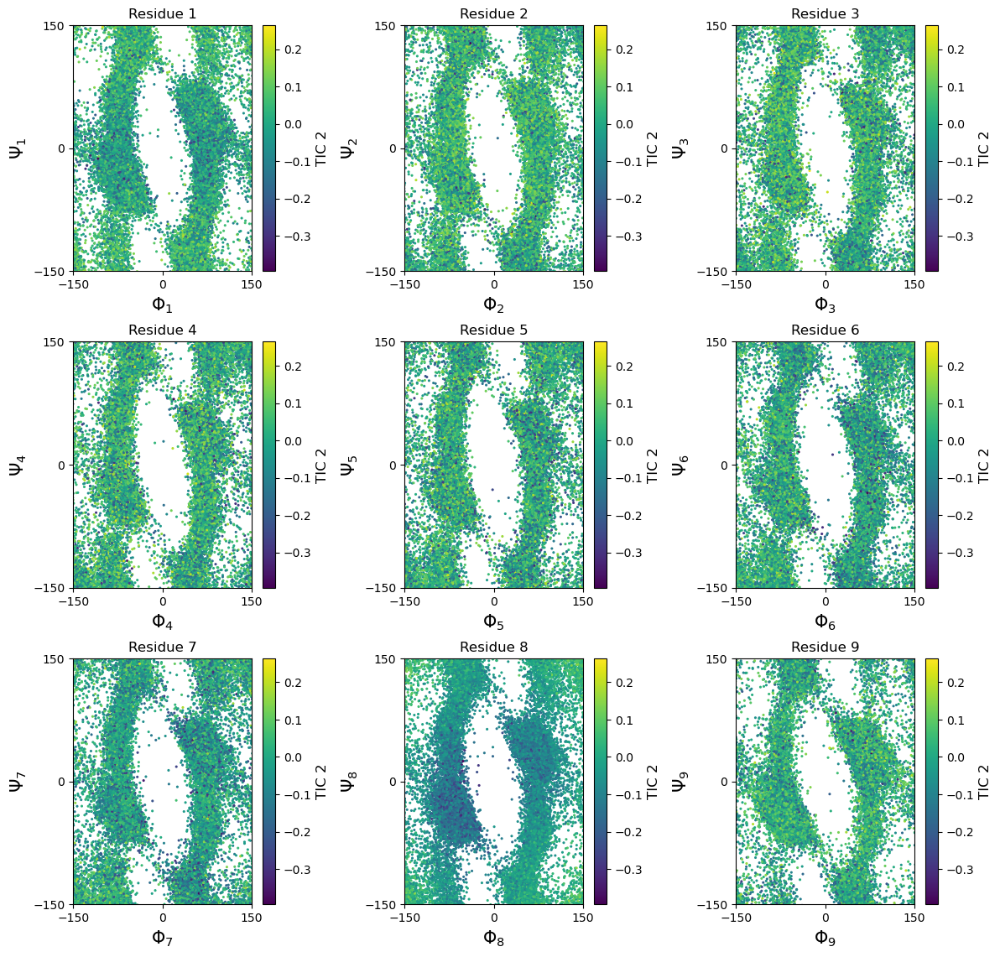

<Figure size 640x480 with 0 Axes>

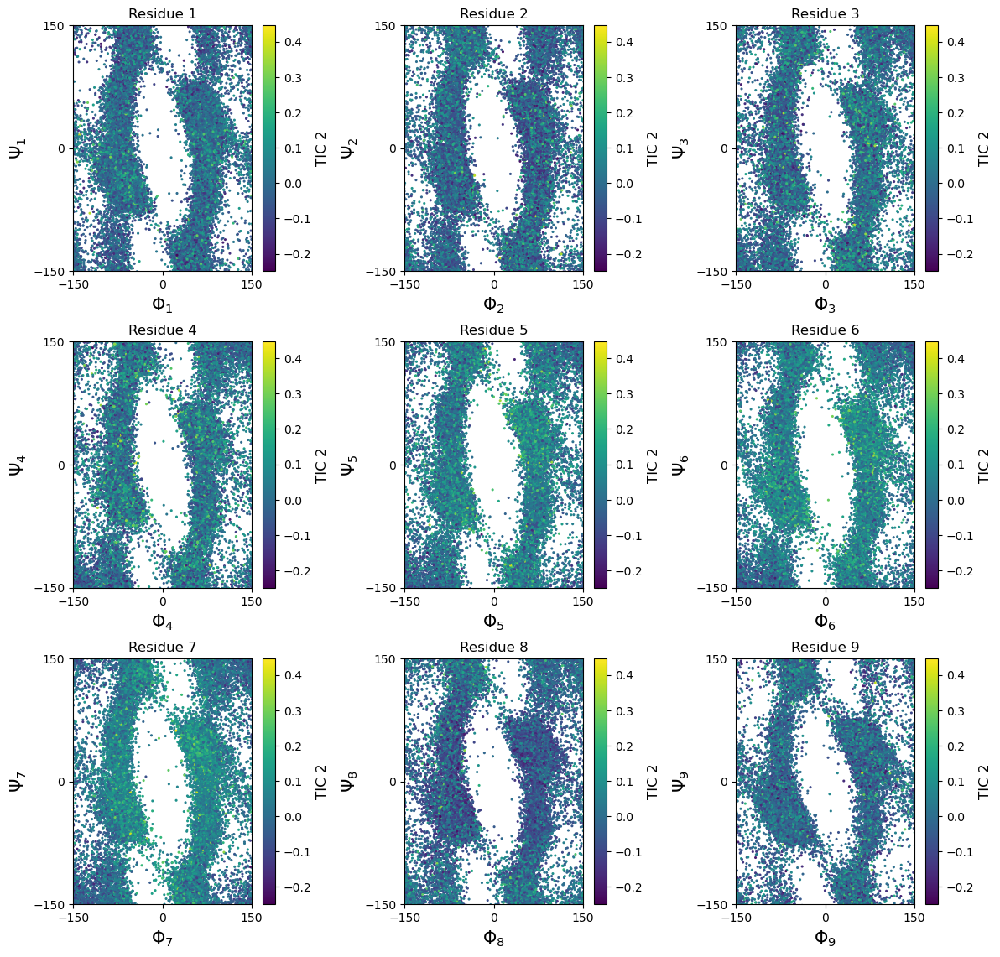

<Figure size 640x480 with 0 Axes>

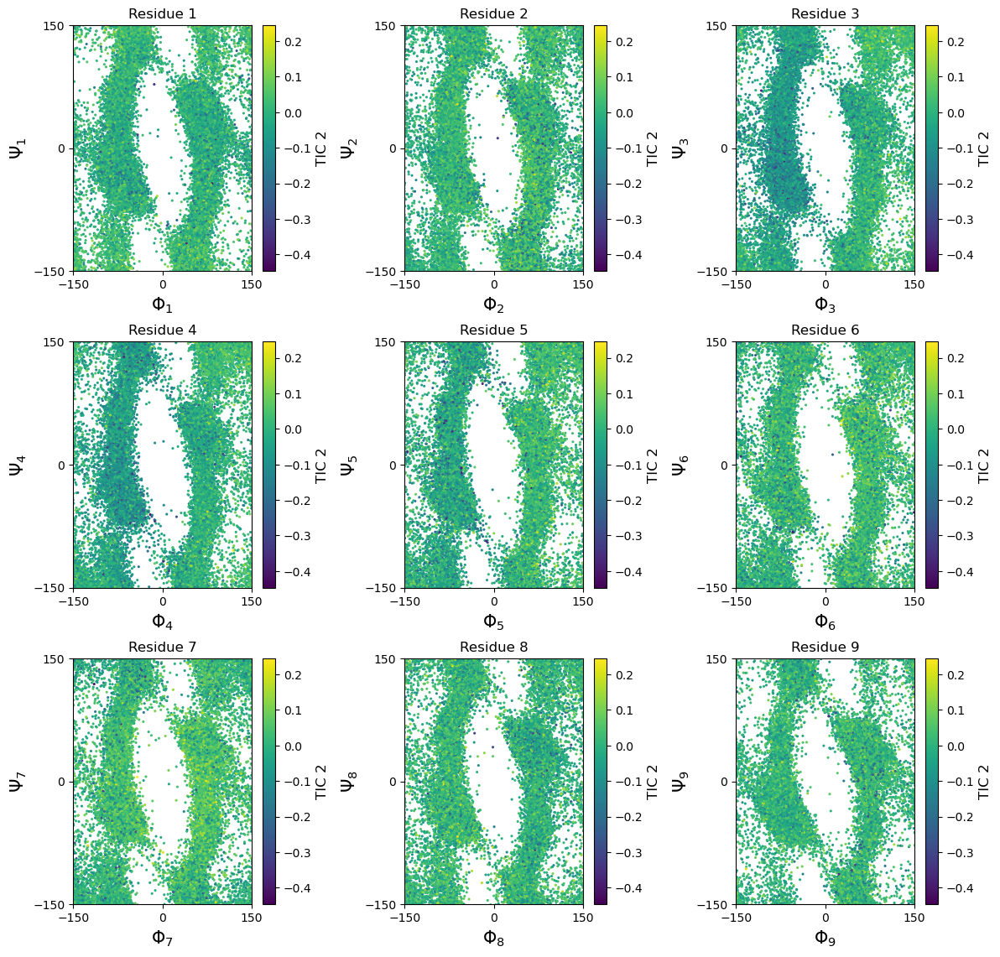

<Figure size 640x480 with 0 Axes>

In [89]:
for i in range(9):
    ramachandran_grid(data_gad[0], phi_atoms, psi_atoms, colorbar=tic_col_dims[i], colorbar_label='TIC 2')

Old code

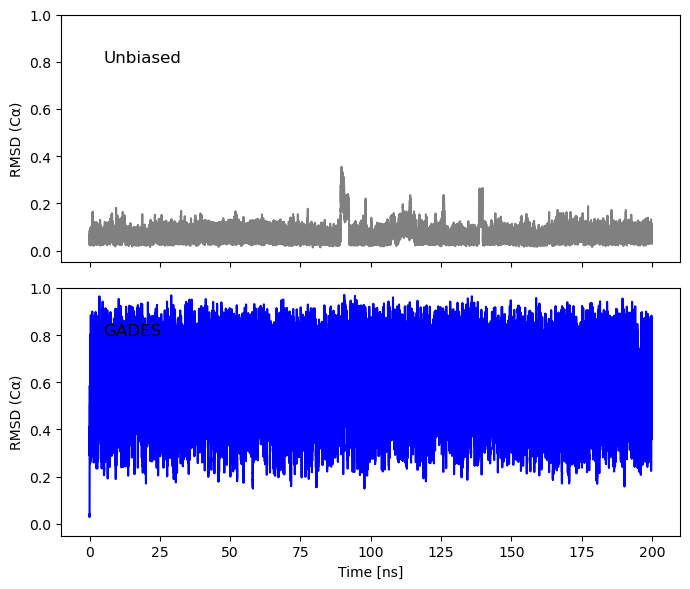

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(7, 6), sharex=True, sharey=True)

# Top plot: Unbiased
axs[0].plot(np.linspace(0, 200, len(data_unbiased[1])), data_unbiased[1], color='grey')
axs[0].set_ylabel('RMSD (Cα)')
axs[0].set_ylim(-0.05, 1)
axs[0].text(5, 0.8, 'Unbiased', fontsize=12)

# Bottom plot: GADES
axs[1].plot(np.linspace(0, 200, len(data_gad[1])), data_gad[1], color='blue', label='GAD')
axs[1].set_xlabel('Time [ns]')
axs[1].set_ylabel('RMSD (Cα)')
axs[1].set_ylim(-0.05, 1)
# axs[1].leg
axs[1].text(5, 0.8, 'GADES', fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:


values = data_gad[1]
n_pick = 10  # how many indices you want

# Step 1: sort all indices by value (highest first)
sorted_indices = np.argsort(values)[::-1]  # descending order

# Step 2: pick indices that are spaced apart
selected_indices = []
spacing = len(sorted_indices) // n_pick

for i in range(n_pick):
    selected_indices.append(sorted_indices[i * spacing])

print("Selected diverse indices:", selected_indices)

Selected diverse indices: [6217, 8018, 5697, 5773, 3910, 4482, 3205, 7667, 4396, 8299]


In [ ]:
# Slice the trajectory
traj_selected = traj[selected_indices]

# Visualize
view = nv.show_mdtraj(traj_selected)
# view.clear_representations()
# view.add_licorice(selection='not water')
# view.add_unitcell()
view

NGLWidget(max_frame=9)

In [ ]:
13503/60/60, 13244/60/60
0.67*60

40.2

In [ ]:
# xyz = traj.xyz[:, traj.top.select('name CA'), :].reshape(traj.n_frames, -1)

# # Apply PCA
# pca = PCA(n_components=2)
# proj = pca.fit_transform(xyz)
# plt.figure(figsize=(8,6))
# plt.scatter(proj[:, 0], proj[:, 1], c=rmsd, cmap='viridis', s=10)
# plt.xlabel('PC1')
# plt.ylabel('PC2')
# plt.title('Chignolin Folding Landscape')
# plt.colorbar(label='RMSD to Native (nm)')
# plt.show()

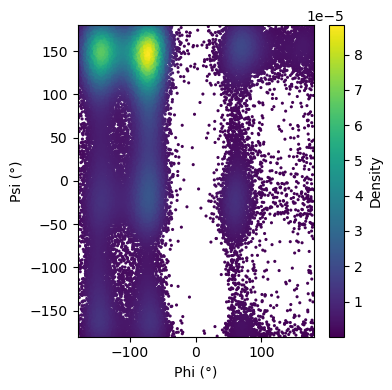

In [ ]:
ramachandran_chig(data_gad[0])

In [ ]:
ramachandran_chig(data_unbiased[0])

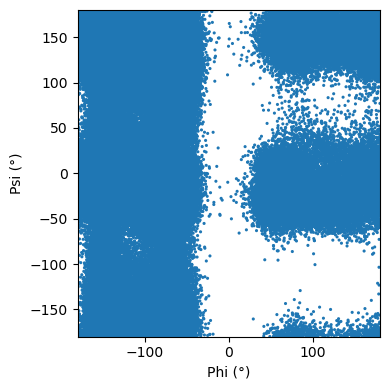

In [ ]:
import mdtraj as md
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# Load trajectory (make sure these files exist)
traj = md.load(f'{job_path}/traj_chignolin_gad.dcd', top=f'{job_path}/equilibrated_chignolin.pdb')




In [ ]:
# trying out tiCA
# pairs
# heavy_atoms
X

array([[0.15126804, 0.24335821, 0.2625229 , ..., 0.2485065 , 0.3188881 ,
        0.16451785],
       [0.15339336, 0.2459895 , 0.2754781 , ..., 0.27798143, 0.32943588,
        0.18112753],
       [0.15616357, 0.25505853, 0.2716284 , ..., 0.2511922 , 0.3294693 ,
        0.18500836],
       ...,
       [0.15022103, 0.24657522, 0.30216596, ..., 0.24365641, 0.32498714,
        0.17873803],
       [0.14449312, 0.24754031, 0.3154083 , ..., 0.27347037, 0.32052156,
        0.16047679],
       [0.14465484, 0.24379142, 0.33177558, ..., 0.26378486, 0.31379005,
        0.17309588]], dtype=float32)

In [6]:
# Just pairwise distances of Cas
traj = data_gad[0]
heavy_atoms =[atom.index for atom in traj.topology.atoms if atom.name == 'CA' and atom.residue.name != 'HOH']
# [atom.index for atom in traj.topology.atoms if atom.element.symbol != 'H']
pairs = [(heavy_atoms[i], heavy_atoms[j]) for i in range(len(heavy_atoms)) for j in range(i+1, len(heavy_atoms))]
X = md.compute_distances(traj, pairs)
print(f"Feature matrix shape: {X.shape}")

Feature matrix shape: (100000, 36)


In [7]:
# ?TICA
20/len(X), len(heavy_atoms)

(0.0002, 9)

In [8]:
initial_lag = 1
tica = TICA(lagtime=initial_lag, dim=5)
tica_model = tica.fit(X).fetch_model()
Y = tica_model.transform(X)

In [ ]:
# eig = np.loadtxt('/home/siddarthachar/gad-linux/GADES/examples/Chignolin-debug/eigvector.log')
# eig[:Y.shape[0]//2,1:]

In [ ]:
# plt.plot(eig)

eig_mean = np.mean(eig[:,1:],axis=1)
eig_sum = np.sum(eig[:,1:],axis=1)
eig_max = np.min(np.abs(eig[:,1:]),axis=1)

In [11]:
# # ?plt.scatter
# eig_vals = np.loadtxt('/home/siddarthachar/gad-linux/achar_examples/Chignolin-debug-eigval/eigvals.log')
# softest_mode = np.min(eig_vals[:,1:], axis=1) 
# # Y.shape
# min_len = np.min([softest_mode.shape[0], Y.shape[0]//2)

In [14]:
Y.shape

(100000, 5)

In [9]:
# --- Step 4: Plot TICA 1 vs TICA 2 ---
plt.figure(figsize=(6, 5))
# sc = plt.scatter(Y[:, 0], Y[:, 1], s=2, c=data_gad[1],cmap="RdBu")
sc = plt.scatter(Y[::2, 0], Y[::2, 1], s=15,cmap="RdBu")
plt.colorbar(sc, label='RMSD')
plt.xlabel('TIC 1')
plt.ylabel('TIC 2')
# plt.grid(True)
plt.tight_layout()
plt.show()

NameError: name 'Y' is not defined

<Figure size 600x500 with 0 Axes>

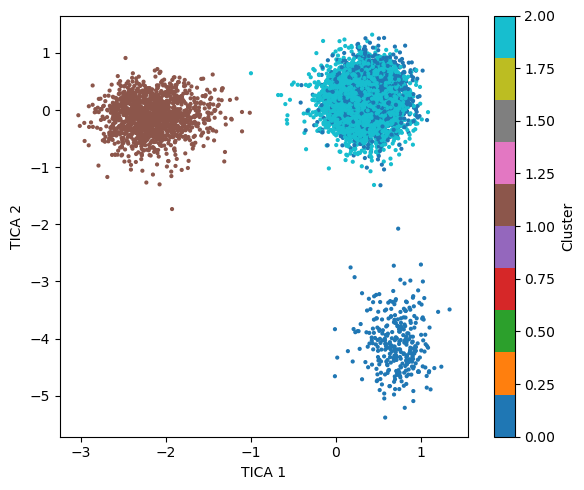

In [ ]:
# --- Step 5: Cluster TICA space ---
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters)
cluster_model = kmeans.fit(Y).fetch_model()
assignments = cluster_model.transform(Y)  # cluster assignments

# Visualize cluster colorings
plt.figure(figsize=(6, 5))
plt.scatter(Y[:, 0], Y[:, 1], c=assignments, cmap='tab10', s=4)
plt.xlabel('TICA 1')
plt.ylabel('TICA 2')
plt.colorbar(label="Cluster")
plt.tight_layout()
plt.show()

In [ ]:
# --- Step 6: Estimate lagtime convergence (implied timescales plot) ---
lags = np.arange(1, 50, 2)  # in frames
timescales = []

for lag in lags:
    # TICA is purely dimensionality reduction; MSM is needed for timescales
    counts = TransitionCountEstimator(lagtime=lag, count_mode='sliding').fit(assignments).fetch_model()
    msm = counts.as_estimator().fit().fetch_model()
    its = msm.timescales()
    timescales.append(its[:5])  # get first few implied timescales

timescales = np.array(timescales)

# --- Step 7: Plot implied timescales ---
plt.figure(figsize=(6,5))
for i in range(timescales.shape[1]):
    plt.plot(lags, timescales[:, i], label=f'TS {i+1}')
plt.xlabel('Lag time (frames)')
plt.ylabel('Timescale (frames)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

AttributeError: 'TransitionCountModel' object has no attribute 'as_estimator'

### trying koopman weighting

If the data that is used for estimation (for the most part) is not in equilibrium, the estimate can become heavily biased in case reversibility is enforced. Koopman reweighting [7] assigns weights to each frame of the time series so that also off-equilibrium data can be used. In deeptime, a Koopman weighting estimator is implemented, which learns appropriate weights from data. The corresponding Koopman model can be used as an argument in TICA’s fit.

This reweighting technique becomes necessary as soon as the available data is not a single long trajectory which equilibrates and then is in an equilibrium state for the rest of the time but rather if many short and at least initially off-equilibrium trajectories are used.

In [ ]:
initial_lag = 1
tica = TICA(lagtime=initial_lag, dim=5)
koopman_estimator = KoopmanWeightingEstimator(lagtime=1)
reweighting_model = koopman_estimator.fit(X).fetch_model() # this gives weights
tica_model_reweighted = tica.fit(X, weights=reweighting_model) \
    .fetch_model()
Y_temp = tica_model_reweighted.transform(X)

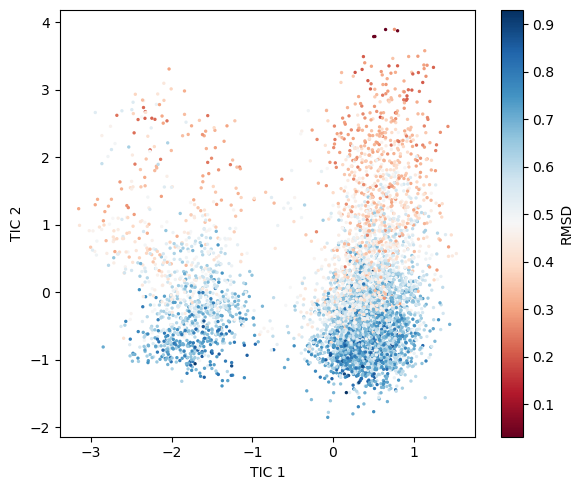

In [ ]:
plt.figure(figsize=(6, 5))
sc = plt.scatter(Y_temp[:, 0], Y_temp[:, 1], s=2, c=data_gad[1],cmap="RdBu")
plt.colorbar(sc, label='RMSD')
plt.xlabel('TIC 1')
plt.ylabel('TIC 2')
# plt.grid(True)
plt.tight_layout()
plt.show()

## Trying deepTICA

In [ ]:
import torch
# from mlcolvar.utils.io import write_pytorch_model
from mlcolvar.cvs import DeepTICA
from sklearn.preprocessing import StandardScaler
from mlcolvar.utils.io import load_dataframe
from mlcolvar.utils.timelagged import create_timelagged_dataset
from mlcolvar.data import DictModule
import tqdm

/home/siddarthachar/.local/lib/python3.9/site-packages/networkx/utils/backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))


In [ ]:
# === Load your trajectory and extract CA-CA distances ===
traj = data_gad[0]  # assuming this is a single trajectory
heavy_atoms = [atom.index for atom in traj.topology.atoms if atom.name == 'CA' and atom.residue.name != 'HOH']
pairs = [(heavy_atoms[i], heavy_atoms[j]) for i in range(len(heavy_atoms)) for j in range(i+1, len(heavy_atoms))]
X = md.compute_distances(traj, pairs)
print(f"Feature matrix shape: {X.shape}")

Feature matrix shape: (5488, 45)


In [ ]:
dataset = create_timelagged_dataset(X,lag_time=50)
datamodule = DictModule(dataset,lengths=[0.8,0.2])#,random_split=False,shuffle=False)

/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/mlcolvar/utils/timelagged.py:140: UserWarning: Monitoring the progress for the search of time-lagged configurations with a progress_bar requires `tqdm`.
  warnings.warn(
/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/mlcolvar/utils/timelagged.py:186: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  x_t = torch.stack(x_t) if type(x) == torch.Tensor else torch.Tensor(x_t)


In [ ]:
datamodule

DictModule(dataset -> DictDataset( "data": [99948, 45], "data_lag": [99948, 45], "weights": [99948], "weights_lag": [99948] ),
		     train_loader -> DictLoader(length=0.8, batch_size=0, shuffle=True),
		     valid_loader -> DictLoader(length=0.2, batch_size=0, shuffle=True))

In [ ]:
# let's just follow the example: https://mlcolvar.readthedocs.io/en/latest/notebooks/tutorials/cvs_DeepTICA.html
from mlcolvar.core.stats import TICA
# define TICA object
n_components=2
tica = TICA(in_features=X.shape[1], out_features=n_components)

# compute vectors that most discriminate the states
eigvals, eigvecs = tica.compute(data=[dataset['data'],dataset['data_lag']],
                    save_params = True, remove_average = True)

/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/mlcolvar/core/stats/utils.py:224: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4413.)
  ave = torch.mean(x.T, 1, keepdim=False).T


In [ ]:
# ?TICA
X.shape[1]

45

In [ ]:
from mlcolvar.utils.plot import muller_brown_potential, plot_isolines_2D, plot_metrics

In [ ]:
# dataset['data_lag'].shape
# eigvecs
# ?plot_isolines_2D

In [ ]:
# fig,axs = plt.subplots(1, n_components, figsize=(5*n_components,4) )
# if n_components == 1:
#     axs = [axs]
# for i in range(n_components):
#     ax = axs[i]
#     # plot_isolines_2D(muller_brown_potential,levels=np.linspace(0,24,12),mode='contour',ax=ax)
#     plot_isolines_2D(tica, component=i, levels=15, ax=ax)
#     ax.scatter(X[:,0],X[:,1],s=1, alpha=0.5,c='b')

In [ ]:
from mlcolvar.cvs import DeepTICA

n_components = 2
nn_layers = [X.shape[1], 100, 500, 100, n_components]
options= {'nn': {'activation': 'tanh'}}

model = DeepTICA(nn_layers, options=options)
model

DeepTICA(
  (loss_fn): ReduceEigenvaluesLoss()
  (norm_in): Normalization(in_features=45, out_features=45, mode=mean_std)
  (nn): FeedForward(
    (nn): Sequential(
      (0): Linear(in_features=45, out_features=100, bias=True)
      (1): Tanh()
      (2): Linear(in_features=100, out_features=500, bias=True)
      (3): Tanh()
      (4): Linear(in_features=500, out_features=100, bias=True)
      (5): Tanh()
      (6): Linear(in_features=100, out_features=2, bias=True)
    )
  )
  (tica): TICA(in_features=2, out_features=2)
)

In [ ]:
import lightning
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from mlcolvar.utils.trainer import MetricsCallback

# define callbacks
metrics = MetricsCallback()
early_stopping = EarlyStopping(monitor="valid_loss", min_delta=1e-3, patience=10)

# define trainer
trainer = lightning.Trainer(callbacks=[metrics, early_stopping],
                     max_epochs=None, logger=None, enable_checkpointing=False)

# fit
trainer.fit( model, datamodule )

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/lightning/pytorch/loops/utilities.py:73: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
You are using a CUDA device ('NVIDIA RTX 5000 Ada Generation') that has Tensor Cores. To properly utilize them, yo

Sanity Checking: |                                                            | 0/? [00:00<?, ?it/s]

/home/siddarthachar/miniconda3/envs/dmff/lib/python3.9/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                                                   | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

Validation: |                                                                 | 0/? [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |        | 0/? [00:00<?, ?it/s]

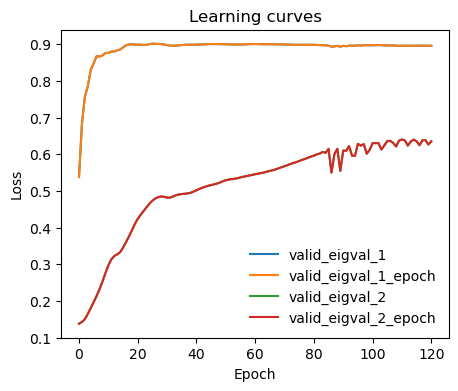

In [ ]:
from mlcolvar.utils.plot import plot_metrics

ax = plot_metrics(metrics.metrics,
                  keys=[x for x in  metrics.metrics.keys() if 'valid_eigval' in x],#['train_loss_epoch','valid_loss'],
                  #linestyles=['-.','-'], colors=['fessa1','fessa5'],
                  yscale='linear')

In [ ]:
from mlcolvar.core.transform import Normalization
from mlcolvar.core.transform.utils import Statistics

#X = dataset[:]['data']
with torch.no_grad():
    model.postprocessing = None # reset
    s = model(torch.Tensor(X))

norm =  Normalization(n_components, mode='min_max', stats = Statistics(s) )
model.postprocessing = norm

In [ ]:
s = model(torch.Tensor(X))
s.detach().numpy()

array([[0.6873803 , 0.61122596],
       [0.4815384 , 0.43655446],
       [0.5433107 , 0.5602773 ],
       ...,
       [0.516703  , 0.6980033 ],
       [0.42784172, 0.63659954],
       [0.5243278 , 0.6639227 ]], dtype=float32)

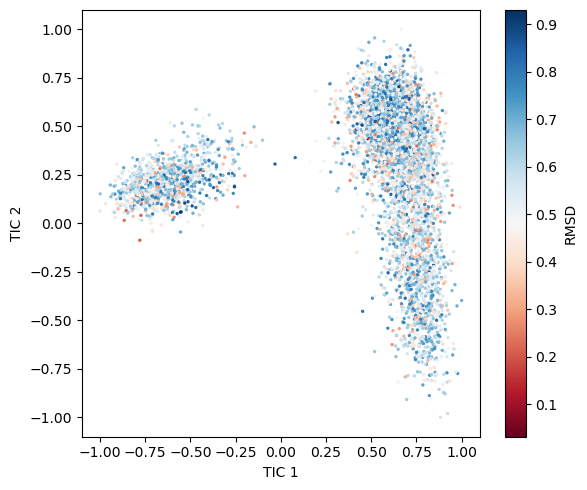

In [ ]:
plt.figure(figsize=(6, 5))
sc = plt.scatter(s.detach().numpy()[:, 0], s.detach().numpy()[:, 1], s=2, c=data_gad[1],cmap="RdBu")
plt.colorbar(sc, label='RMSD')
plt.xlabel('TIC 1')
plt.ylabel('TIC 2')
# plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# === Prepare the data as a PyTorch tensor ===
X_tensor = torch.tensor(X_scaled, dtype=torch.float32)

# === Define DeepTICA model ===
deep_tica = DeepTICA(
    input_dim=X_tensor.shape[1],
    dim=5,                # number of slow modes to learn
    lag_time=200,         # time lag
    layers=[50, 50],      # neural net layers
    activation="relu",    # activation function
    batch_size=1024,
    learning_rate=1e-3,
    max_epochs=500,
    verbose=True
)

TypeError: __init__() got an unexpected keyword argument 'input_dim'

## between all heavy atoms

In [ ]:
# --- Step 2: Compute heavy atom distances ---
traj = data_gad[0]
exclude_atom_name=['Na','H','Cl']
heavy_atoms = [atom.index for atom in traj.topology.atoms if atom.name not in exclude_atom_name and atom.residue.name != 'HOH']
# [atom.index for atom in traj.topology.atoms if atom.element.symbol != 'H']
pairs = [(heavy_atoms[i], heavy_atoms[j]) for i in range(len(heavy_atoms)) for j in range(i+1, len(heavy_atoms))]
X = md.compute_distances(traj, pairs)
print(f"Feature matrix shape: {X.shape}")

Feature matrix shape: (100000, 8256)


In [ ]:
# --- Step 3: TICA (with initial lagtime) ---
initial_lag = 1
tica = TICA(lagtime=initial_lag, dim=2)
tica_model = tica.fit(X).fetch_model()
Y = tica_model.transform(X)

In [ ]:
# --- Step 4: Plot TICA 1 vs TICA 2 ---
plt.figure(figsize=(6, 5))
plt.scatter(Y[:, 0], Y[:, 1], s=2, alpha=0.5)
plt.xlabel('TICA 1')
plt.ylabel('TICA 2')
plt.grid(True)
plt.tight_layout()
plt.show()

Feature matrix shape: (100000, 8256)


In [ ]:
# --- Step 5: Cluster TICA space ---
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters)
cluster_model = kmeans.fit(Y).fetch_model()
assignments = cluster_model.transform(Y)  # cluster assignments

# Visualize cluster colorings
plt.figure(figsize=(6, 5))
plt.scatter(Y[:, 0], Y[:, 1], c=assignments, cmap='tab10', s=4)
plt.xlabel('TICA 1')
plt.ylabel('TICA 2')
plt.colorbar(label="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Step 6: Estimate lagtime convergence (implied timescales plot) ---
lags = np.arange(1, 50, 2)  # in frames
timescales = []

for lag in lags:
    # TICA is purely dimensionality reduction; MSM is needed for timescales
    counts = TransitionCountEstimator(lagtime=lag, count_mode='sliding').fit(assignments).fetch_model()
    msm = counts.as_estimator().fit().fetch_model()
    its = msm.timescales()
    timescales.append(its[:5])  # get first few implied timescales

timescales = np.array(timescales)

# --- Step 7: Plot implied timescales ---
plt.figure(figsize=(6,5))
for i in range(timescales.shape[1]):
    plt.plot(lags, timescales[:, i], label=f'TS {i+1}')
plt.xlabel('Lag time (frames)')
plt.ylabel('Timescale (frames)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()